In [20]:
import pandas as pd
import matplotlib.pyplot as plt

In [23]:
glob.glob(f'{doe_dir}/*')

['/home/ppiper/ihtc_repository/data/doe_more_design_variables/63',
 '/home/ppiper/ihtc_repository/data/doe_more_design_variables/81',
 '/home/ppiper/ihtc_repository/data/doe_more_design_variables/95',
 '/home/ppiper/ihtc_repository/data/doe_more_design_variables/84',
 '/home/ppiper/ihtc_repository/data/doe_more_design_variables/28',
 '/home/ppiper/ihtc_repository/data/doe_more_design_variables/101',
 '/home/ppiper/ihtc_repository/data/doe_more_design_variables/120',
 '/home/ppiper/ihtc_repository/data/doe_more_design_variables/21',
 '/home/ppiper/ihtc_repository/data/doe_more_design_variables/105',
 '/home/ppiper/ihtc_repository/data/doe_more_design_variables/102',
 '/home/ppiper/ihtc_repository/data/doe_more_design_variables/88',
 '/home/ppiper/ihtc_repository/data/doe_more_design_variables/3',
 '/home/ppiper/ihtc_repository/data/doe_more_design_variables/87',
 '/home/ppiper/ihtc_repository/data/doe_more_design_variables/29',
 '/home/ppiper/ihtc_repository/data/doe_more_design_variabl

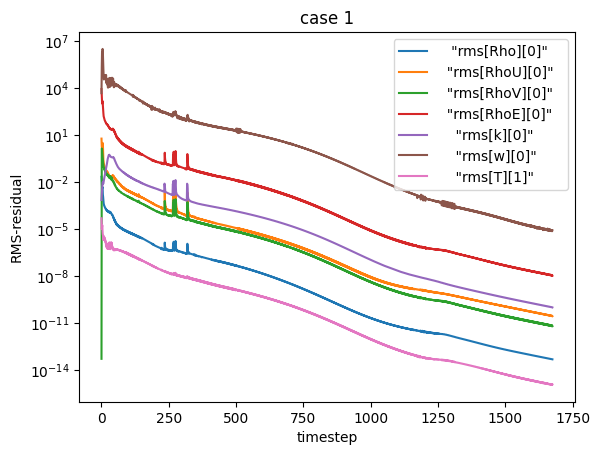

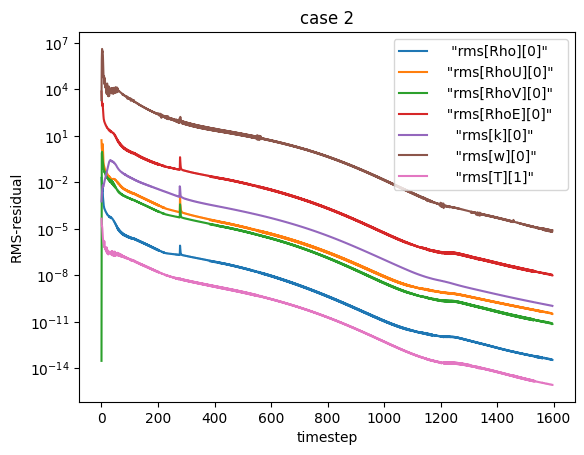

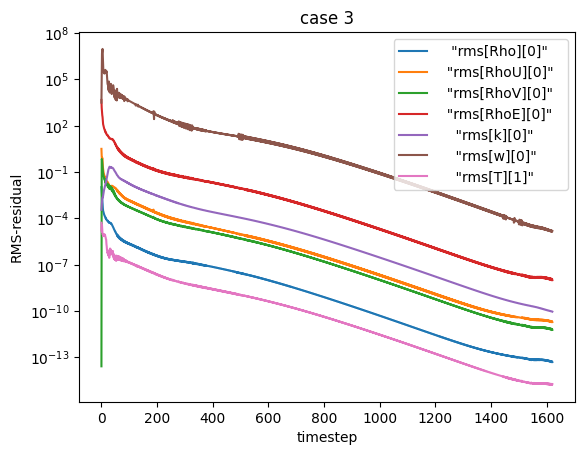

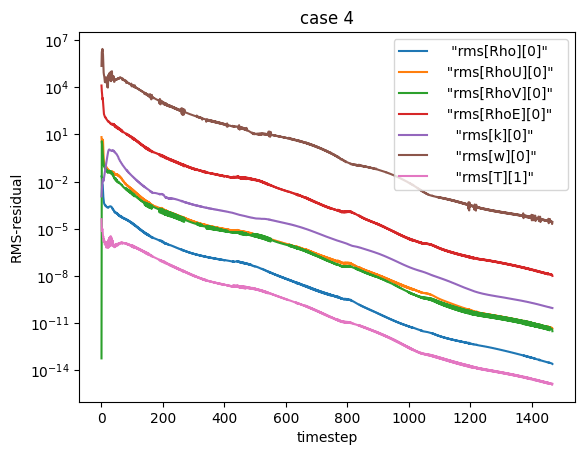

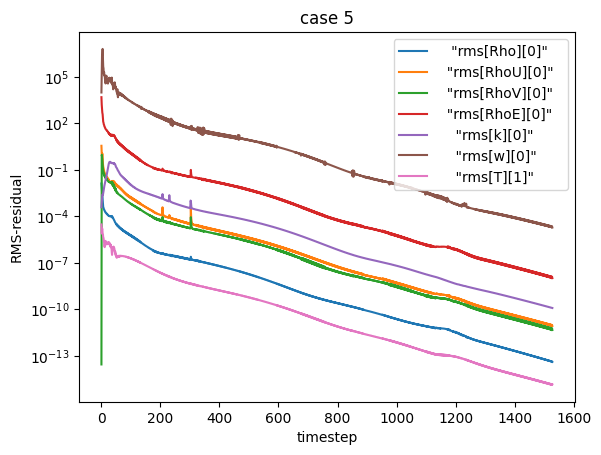

...

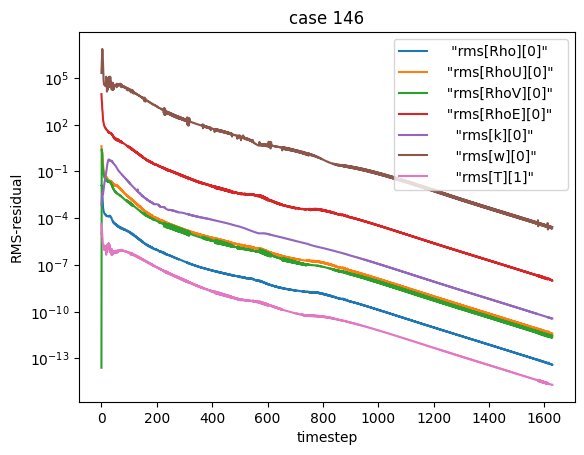

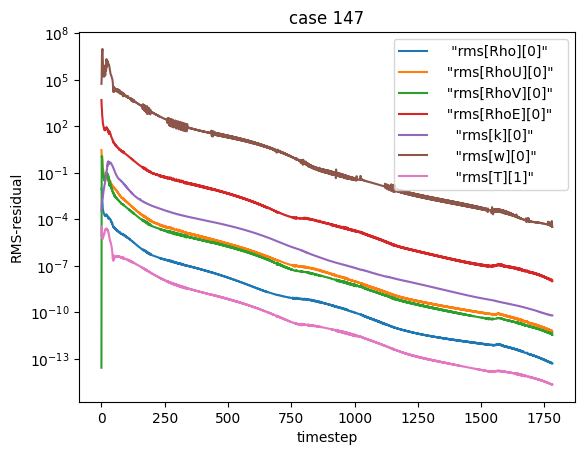

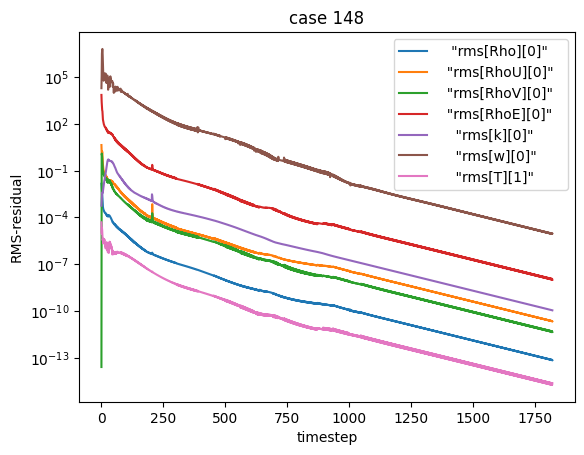

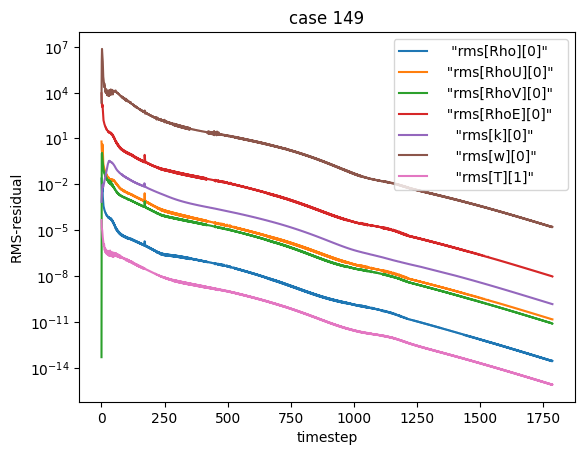

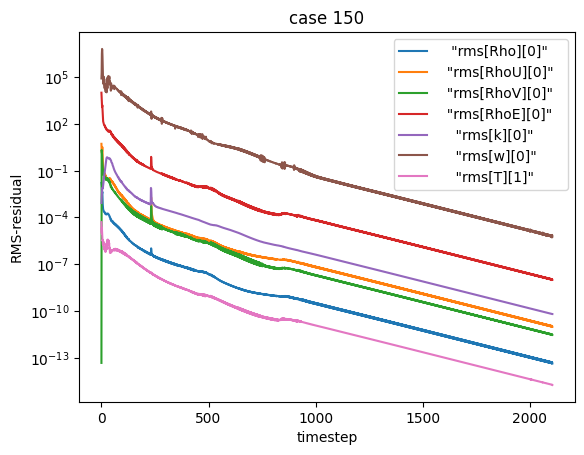

In [24]:
import glob

doe_dir = '/home/ppiper/ihtc_repository/data/doe_more_design_variables'
 
convergence = 1e-4
end_case_no = 150



for i in range(1,end_case_no+1):
    residue = pd.read_csv(f'{doe_dir}/{i}/SU2/outputs/cht_setupSU2.csv')

    residue.keys()[1:]

    converged = True
    for res in residue.keys()[1:]:
        if 10**residue[res].to_numpy()[-1] > convergence:
            converged = False

    if converged:
        plt.figure()
        for res in residue.keys()[1:]:
            plt.plot(10**residue[res][:], label=f'{res}')

        plt.title(f'case {i}')
        plt.yscale('log')
        plt.ylabel('RMS-residual')
        plt.xlabel('timestep')
        plt.legend()
        plt.show()

In [3]:
import pandas as pd
pd.read_csv('/home/ppiper/ihtc_repository/data/doe_more_design_variables/doe_more_design_variables.txt')

,ID,Thickness,CP3_y,T0in,p0in,outerTemperature
0,1,0.007030,-0.004963,489.0,823256.603023,359.0
1,2,0.005604,-0.002314,451.0,753770.670255,376.0
2,3,0.006003,-0.001235,507.0,476838.644912,393.0
3,4,0.008308,-0.007900,658.0,977509.597900,322.0
4,5,0.003407,-0.003504,423.0,519674.714115,291.0
...,...,...,...,...,...,...
145,146,0.008831,-0.007996,653.0,612997.514352,324.0
146,147,0.006905,-0.011722,486.0,430778.163564,296.0
147,148,0.007987,-0.004203,557.0,640113.474630,372.0
148,149,0.007307,-0.007670,456.0,930599.595474,387.0


In [34]:
import pandas as pd
from pathlib import Path

def get_converged(doe_file, doe_dir):
    """
    Get converged solutions
    """

    doe = pd.read_csv(doe_file)

    convergence_criteria = 1e-4
    end_case_no =  doe.ID.iloc[-1]
    converged_ids = []
    not_converged_ids = []

    for i, elem in doe.iterrows():
        # load convergence file for given ID (elem.ID)
        residue = pd.read_csv(Path(doe_dir) / f'{int(elem.ID)}/SU2/outputs/cht_setupSU2.csv')

        # check convergence over all residue
        converged = True    
        for res in residue.keys()[1:]:
            if 10**residue[res].to_numpy()[-1] > convergence_criteria:
                converged = False
            
        # if converged store ID 
        if converged:
            converged_ids.append(int(elem.ID))
        else:
            not_converged_ids.append(int(elem.ID))

    return converged_ids, not_converged_ids


doe_dir = '/home/ppiper/ihtc_repository/data/doe_more_design_variables'
doe_file = Path(doe_dir) / 'doe_more_design_variables.txt'

converged_ids = get_converged(doe_file=doe_file, doe_dir=doe_dir)

In [28]:
import numpy as np

np.array(converged_ids).size

138

In [35]:
doe_dir = '/home/ppiper/ihtc_repository/data/experimental_planning'
doe_file = Path(doe_dir) / 'doe_experimental_planning.txt'

converged_ids = get_converged(doe_file=doe_file, doe_dir=doe_dir)
converged_ids

([1,
  2,
  3,
  4,
  6,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  22,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  40,
  41,
  42,
  43],
 [5, 7, 8, 21, 23, 24, 39])